# Computer Vision - P2

## Delivery

Up to **1 point out of 10** will be penalized if the following requirements are not fulfilled:

- Implemented code should be commented.

- The questions introduced in the exercises must be answered.

- Comments need to be in **english**.

- The deliverable must be a file named **P2_Student1_Student2.zip** that includes:
    - The notebook P2_Student1_Student2.ipynb completed with the solutions to the exercises and their corresponding comments.
    - All the images used in this notebook.

**Deadline (Campus Virtual): October 22nd, 23:00 h** 

==============================================================================================
## Practicum 2: Filtering and edge detection

==============================================================================================

In [2]:
from skimage import img_as_float, io, color, filters, feature, util, morphology
from skimage.color import rgb2gray
from skimage.util import img_as_ubyte
from skimage.transform import resize
from skimage.measure import label, regionprops
import skimage.filters
from skimage.exposure import histogram
from skimage.morphology import disk, rectangle, diamond
import matplotlib.pyplot as plt
import numpy as np
from scipy import ndimage

The main topics are:
1. Image smoothing and convolution (exercises 2.1, 2.2, 2.3 and 2.4)
2. Edge detection (exercises 2.5, 2.6 and 2.7)

In order to complete this practicum, the following concepts need to be understood: linear filters, histograms, convolutions, and edges.

The following chapters of the book "Computer Vision: Algorithms and Applications" by Richard Szeliski provide additional information:
* Chapter 3. Image processing: Point operators & linear filtering.
* Chapter 4. Feature detection and matching: Edges.

### 2.1 RGB histogram visualization

a) Read the image `./images_notebook/oryx.png` and visualize the RGB image as well as each of its channels separately (R, G, and B). Print the image shape and data type.

<img src="images_notebook/oryx.jpg">

**Note:** Before applying the histogram, you should pass the image into float.

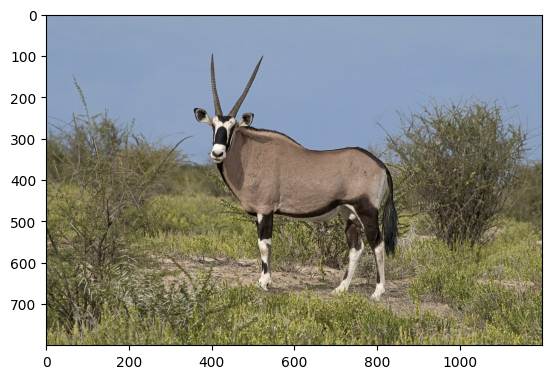

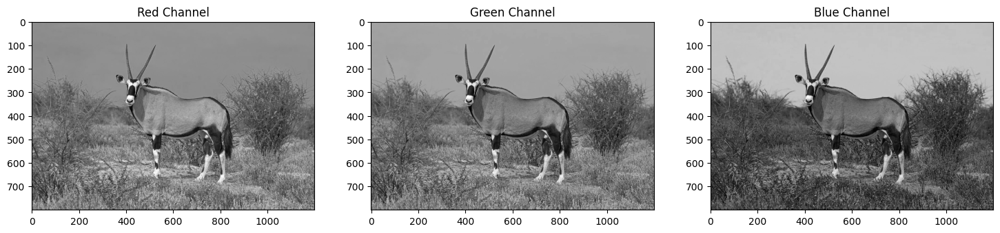

(800, 1200, 3)
uint8


In [3]:
# Load the image from the specified path
image = io.imread('images_notebook/oryx.jpg')

# Split the image into its Red, Green, and Blue components
R, G, B = image[:, :, 0], image[:, :, 1], image[:, :, 2]

# Display the original image
plt.imshow(image)

# Create a new figure with a specified size for subplots
fig = plt.figure(figsize=(18, 9))

# Add the first subplot for the Red channel
fig.add_subplot(1, 3, 1)  # 1 row, 3 columns, position 1
plt.imshow(R, cmap='gray')  # Display the Red channel in grayscale
plt.title('Red Channel')  # Add title for clarity

# Add the second subplot for the Green channel
fig.add_subplot(1, 3, 2)  # 1 row, 3 columns, position 2
plt.imshow(G, cmap='gray')  # Display the Green channel in grayscale
plt.title('Green Channel')  # Add title for clarity

# Add the third subplot for the Blue channel
fig.add_subplot(1, 3, 3)  # 1 row, 3 columns, position 3
plt.imshow(B, cmap='gray')  # Display the Blue channel in grayscale
plt.title('Blue Channel')  # Add title for clarity

# Show the figure with all subplots
plt.show()

# Print the shape of the original image (height, width, channels)
print(image.shape)

# Print the data type of the image array
print(image.dtype)


b) Make a function `im_hist(im,  nbins=8)` to visualize the histogram of the RGB, and grayscale images. What is the histogram representing for an image? 

The plotted histogram must accomplish these requirements (see image bellow as an example of histogram extraction):

- Obtain the histogram with 16, 32, 64 and 256 bins. What are the bins representing?

- Visualize the histogram of each channel and the gray level image separately and compare them. Comment their differences (between different channels and different number of bins).

**Note:** What type should be the image in order to compute the histogram? Check using different bins for the histogram. 

**Hint** : the `exposure` module within the `skimage` library makes the histogram extraction easy!

**Help:** [matplotlib image tutorial](https://matplotlib.org/users/image_tutorial.html)

<img src='images_notebook/histograms.png'>

A histogram represents the distribution of pixel intensities in an image. It shows how many pixels have a particular intensity or fall within a range of intensities. For grayscale images, the histogram reflects the brightness distribution, while for RGB images, separate histograms for the red, green, and blue channels show the distribution of color intensities.

FALTAN CONTESTAR PREGUNTAS, PERO ESQUE NO SE PORQUE NO FUNCIONA

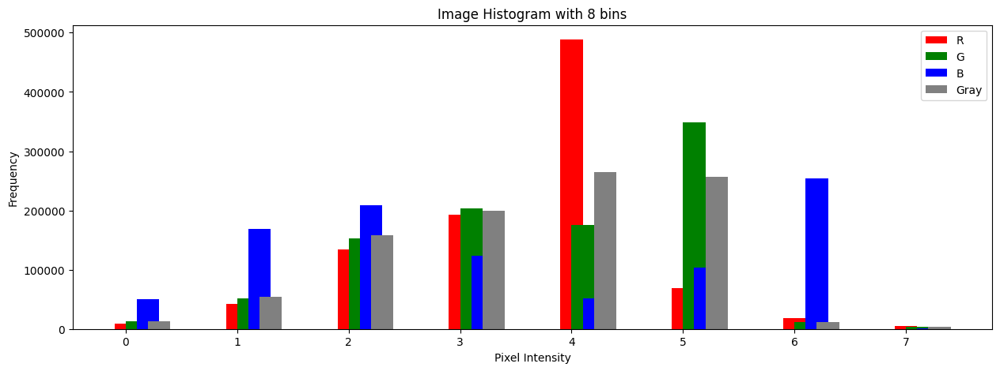

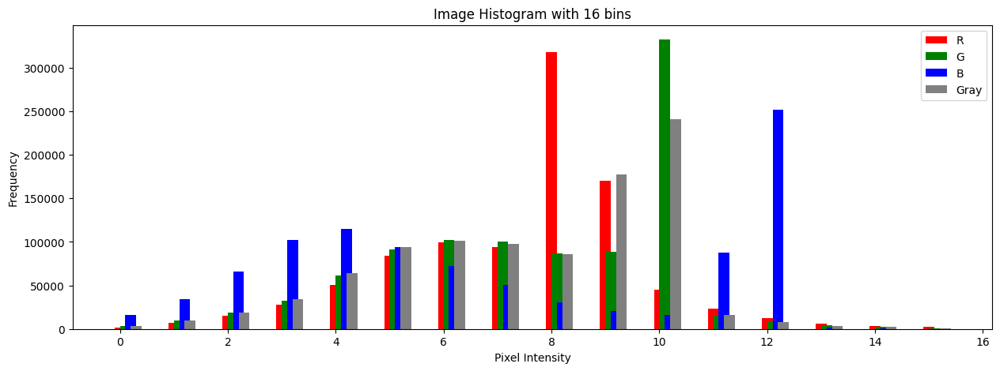

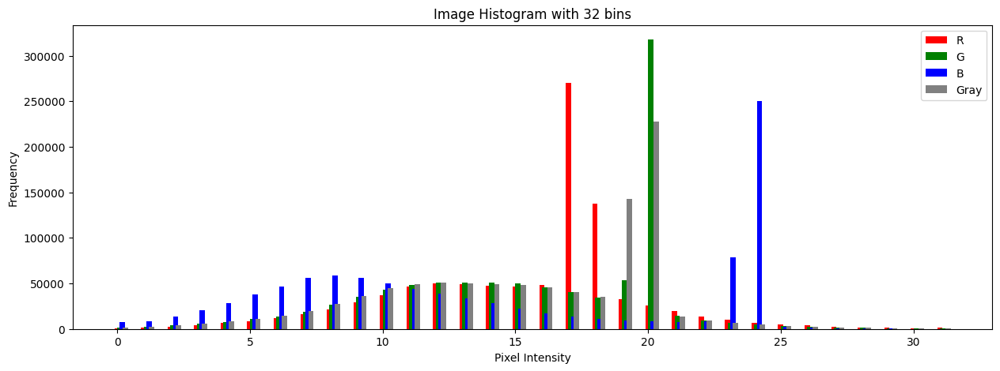

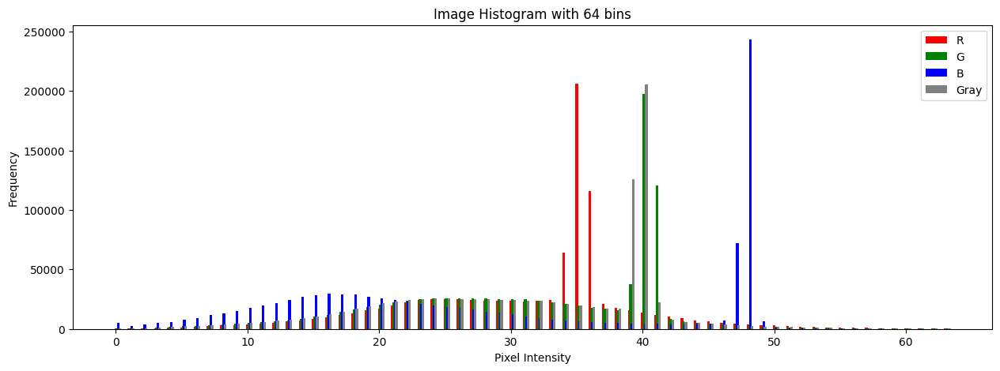

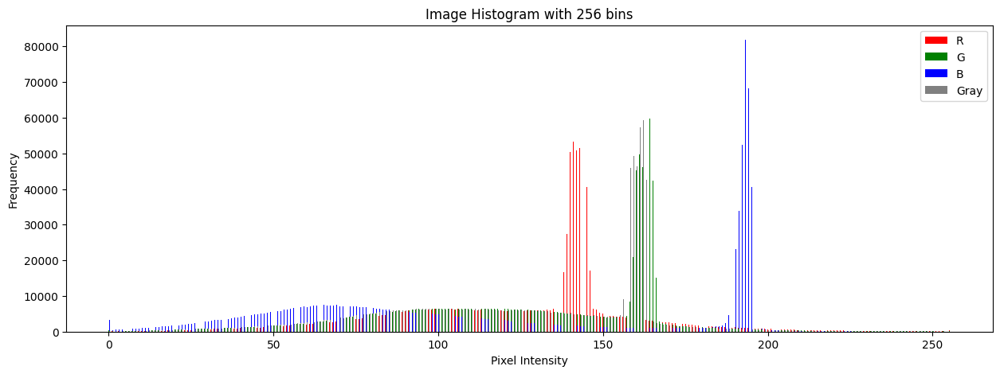

In [4]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from skimage import color, exposure, util
from skimage.util import img_as_float

# Define a function to calculate and plot the histogram of an image
def im_hist(im, nbins=8):
    # Convert the input image to grayscale
    im_gray = color.rgb2gray(im)

    # Calculate histograms for each color channel (R, G, B)
    histogram_R, _ = exposure.histogram(img_as_float(im[:, :, 0]), nbins=nbins)  # Red channel
    histogram_G, _ = exposure.histogram(img_as_float(im[:, :, 1]), nbins=nbins)  # Green channel
    histogram_B, _ = exposure.histogram(img_as_float(im[:, :, 2]), nbins=nbins)  # Blue channel
    histogram_Gray, _ = exposure.histogram(img_as_float(im_gray), nbins=nbins)    # Grayscale

    # Set positions for each set of bars
    bar_width = 0.20  # Width of each bar
    ind = np.arange(nbins)  # Positions of the bars

    # Create the figure and axes for the plot
    fig, ax = plt.subplots(figsize=(15, 5))

    # Draw bars for each color channel with offsets for visibility
    ax.bar(ind, histogram_R, width=bar_width, color='red', label='R')                # Red bars
    ax.bar(ind + 0.1, histogram_G, width=bar_width, color='green', label='G')      # Green bars
    ax.bar(ind + 0.2, histogram_B, width=bar_width, color='blue', label='B')       # Blue bars
    ax.bar(ind + 0.3, histogram_Gray, width=bar_width, color='gray', label='Gray')  # Grayscale bars

    # Configure labels and legend
    ax.set_xlabel('Pixel Intensity')  # X-axis label
    ax.set_ylabel('Frequency')         # Y-axis label
    ax.set_title(f'Image Histogram with {nbins} bins')  # Title of the plot
    ax.legend()  # Display the legend

    # Show the plot
    plt.show()

# Call the histogram function with different number of bins for the input image
im_hist(image)        # 8 bins
im_hist(image, nbins=16)  # 16 bins
im_hist(image, nbins=32)  # 32 bins
im_hist(image, nbins=64)  # 64 bins
im_hist(image, nbins=256)  # 256 bins


#### What is the histogram representing for an image?
- The histogram of an image represents the distribution of pixel intensities across different channels or grayscale levels for a grayscale image. Each bin in the histogram corresponds to a range of pixel intensity values, and the height of the bin indicates the number of pixels that fall within that range.

#### What are the bins representing?
- The bins represent ranges of pixel intensity values. This range determines the granularity of the histogram. More bins provide a more detailed view of the intensity distribution, while fewer bins give a broader overview.

#### Comment their differences (between different channels and different number of bins).
- The red channel shows a significant increase in a narrower range of intensity values, indicating a greater presence of red tones in that specific region. Green and blue also show distinct peaks, suggesting that certain intensities of those colors are more present in the image. The grayscale histogram, on the other hand, is more uniform and shows a distribution that integrates all three color channels. It represents a combination of the intensity values of the R, G and B channels. Because of this, the grayscale histogram can smooth out the peaks that are clearly visible in the histograms of each color channel. 
- In conclusion the higher peaks in the color channels indicate that there are particular intensities of each color that are more dominant in the image. On the other hand, the grayscale histogram tends to be less detailed in the individual peaks, as it blends the color information into a black and white representation.

### 2.2 Grayscale and RGB images filtering (convolutions)

a) Read the image `./images_notebook/oryx.png`. Reshape the image to $256x256$ pixels and convert to gray scale (i.e. `oryx_gray`). We are going to apply:

1. Convolve `oryx_gray` with a horizontal mask `mask_h1d=[[1,1,1,1,1,1,1,1,1,1,1,1,1,1,1]]` using the function `ndimage.convolve()` of the package `scipy`.
2. Convolve `oryx_gray` with a transposed version of the mask in (2).
3. Convolve `oryx_gray` with a uniform `two-dimensional` mask of dimensions 15x15 with all values set to 1.

Check the maximum and minimum values, as well as the data type of each imagea.

- Is the type of the mask important for the convolution? What effect does each of the masks produce on the original image? Compare the results.


**Note:** The command `convolve` performs a multidimensional convolution! A vector should be represented as: [[1,...1]].

**Note:** Remember that before applying the `convolve` function the mask must be normalized (i.e. all values in the mask must sum 1).


In [5]:
# Load the image from the specified path
image = io.imread('images_notebook/oryx.jpg')

# Resize the image to 256x256 pixels
resized_image = resize(image, (256, 256))

# Convert the resized image to grayscale
oryx_gray = rgb2gray(resized_image)

# Create a horizontal 1D averaging mask of size 1x13
mask_h1d = np.ones((1, 13)) / 13

# Convolve the grayscale image with the horizontal mask
convolved_h = ndimage.convolve(oryx_gray, mask_h1d, mode='reflect')

# Create a vertical 1D averaging mask by transposing the horizontal mask
mask_v1d = mask_h1d.T

# Convolve the grayscale image with the vertical mask
convolved_v = ndimage.convolve(oryx_gray, mask_v1d, mode='reflect')

# Create a 15x15 uniform averaging mask
mask_uniform = np.ones((15, 15)) / (13 * 15)

# Convolve the grayscale image with the uniform mask
convolved_uniform = ndimage.convolve(oryx_gray, mask_uniform, mode='reflect')

# Print the minimum, maximum, mean value, and data type of the original grayscale image
print(f"Value Original Image: {oryx_gray.min()} {oryx_gray.max()} {oryx_gray.mean()} {oryx_gray.dtype}")

# Print the minimum, maximum, mean value, and data type of the horizontally convolved image
print(f"Value Convolved Image H: {convolved_h.min()} {convolved_h.max()} {convolved_h.mean()} {convolved_h.dtype}")

# Print the minimum, maximum, mean value, and data type of the vertically convolved image
print(f"Value Convolved Image V: {convolved_v.min()} {convolved_v.max()} {convolved_v.mean()} {convolved_v.dtype}")

# Print the minimum, maximum, mean value, and data type of the uniformly convolved image
print(f"Value Convolved Image Uniform: {convolved_uniform.min()} {convolved_uniform.max()} {convolved_uniform.mean()} {convolved_uniform.dtype}")


Value Original Image: 0.023931331427080104 0.9855090831044124 0.5004917315391727 float64
Value Convolved Image H: 0.07824362815586242 0.7570050990611213 0.5004917315391727 float64
Value Convolved Image V: 0.0841888003291913 0.8383529455187306 0.5004917315391727 float64
Value Convolved Image Uniform: 0.18602607405502608 0.7392533159540815 0.5774904594682763 float64


#### Is the type of the mask important for the convolution? What effect does each of the masks produce on the original image? Compare the results
- The importance of the mask type lies in how it affects the original image during convolution. In the horizontal mask it acts by smoothing the image in the horizontal direction. As all values are 1 and are normalized (making their sum 1), the result is a linear blur effect, where pixels are averaged along the row. The vertical mask, on the other hand, the smoothing occurs in the vertical direction instead of the horizontal. That is, pixels are averaged up and down instead of sideways. Finally the uniform 15x15 mask applies a blur in all directions, since it is a square matrix. The effect is a stronger smoothing than the previous ones, as more neighboring pixels are considered. It is like a more uniform blur throughout the image.
- We can observe that the horizontal mask and its transpose smooth in a specific direction, i.e. horizontally or vertically, while the 15x15 does it in both directions. Also the 15x15 is more noticeable and homogeneous, reducing details more than with the 1D masks.

b) Visualize the four images, `oryx_gray` and the output of each step (1 to 3) in a single figure, with the corresponding titles.


Note: Remember that `matplotlib.pyplot` automatically rescales the values of the image before displaying them. Visualize with and without pixel values range rescaling.


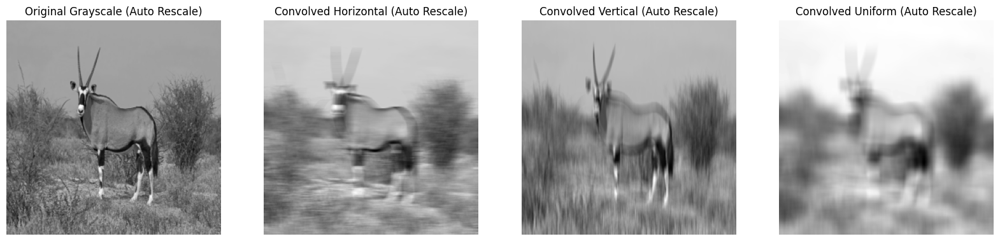

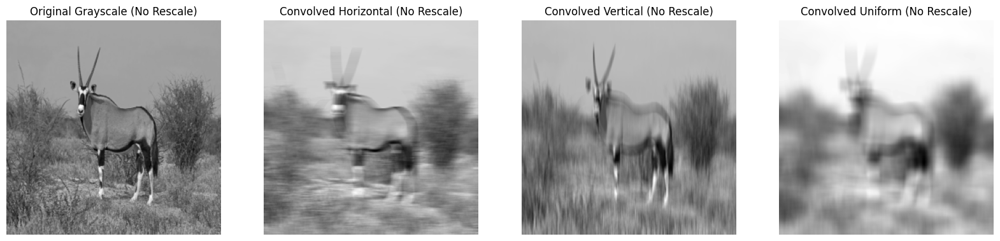

In [6]:
# Visualization with automatic rescaling
fig, axs = plt.subplots(1, 4, figsize=(20, 10))

axs[0].imshow(oryx_gray, cmap='gray')
axs[0].set_title('Original Grayscale (Auto Rescale)')
axs[0].axis('off')

axs[1].imshow(convolved_h, cmap='gray')
axs[1].set_title('Convolved Horizontal (Auto Rescale)')
axs[1].axis('off')

axs[2].imshow(convolved_v, cmap='gray')
axs[2].set_title('Convolved Vertical (Auto Rescale)')
axs[2].axis('off')

axs[3].imshow(convolved_uniform, cmap='gray')
axs[3].set_title('Convolved Uniform (Auto Rescale)')
axs[3].axis('off')

plt.show()

# Visualization without automatic rescaling (using original pixel values)
fig, axs = plt.subplots(1, 4, figsize=(20, 10))

axs[0].imshow(oryx_gray, cmap='gray', vmax=oryx_gray.max(), vmin=oryx_gray.min())
axs[0].set_title('Original Grayscale (No Rescale)')
axs[0].axis('off')

axs[1].imshow(convolved_h, cmap='gray', vmax=convolved_h.max(), vmin=convolved_h.min())
axs[1].set_title('Convolved Horizontal (No Rescale)')
axs[1].axis('off')

axs[2].imshow(convolved_v, cmap='gray', vmax=convolved_v.max(), vmin=convolved_v.min())
axs[2].set_title('Convolved Vertical (No Rescale)')
axs[2].axis('off')

axs[3].imshow(convolved_uniform, cmap='gray', vmax=convolved_uniform.max(), vmin=convolved_uniform.min())
axs[3].set_title('Convolved Uniform (No Rescale)')
axs[3].axis('off')

plt.show()

c) Can we convolve a color (RGB) image? 

Implement a function `conv_coor(image, mask)` that applies a 3-channel filter.  Reshape the original `oryx.png` image to $256x256$ pixels and try your funcion, using a 7x7 uniform mask.


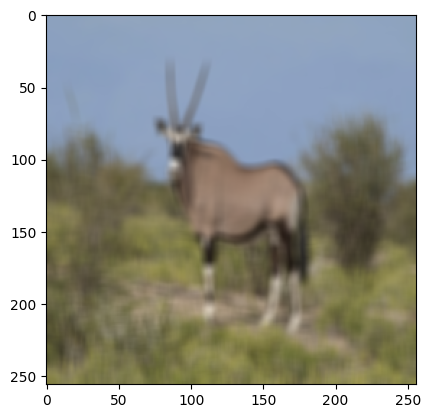

In [7]:
def conv_coor(image, mask):
    # Resize the input image to a fixed size of 256x256 pixels
    oryx_reshaped = resize(image, (256, 256))

    # Convolve the red channel of the image with the provided mask
    R_convolved = ndimage.convolve(oryx_reshaped[:, :, 0], mask, mode='reflect')
    
    # Convolve the green channel of the image with the provided mask
    G_convolved = ndimage.convolve(oryx_reshaped[:, :, 1], mask, mode='reflect')
    
    # Convolve the blue channel of the image with the provided mask
    B_convolved = ndimage.convolve(oryx_reshaped[:, :, 2], mask, mode='reflect')

    # Stack the convolved channels back into a single RGB image
    oryx_RGB_convolved = np.stack([R_convolved, G_convolved, B_convolved], axis=2)

    # Display the convolved RGB image
    plt.imshow(oryx_RGB_convolved)

# Create a uniform mask of size 7x7 and normalize it
mask = np.ones((7, 7)) / (7 * 7)

# Call the conv_coor function with the input image and the mask
conv_coor(image, mask)
    

### 2.3 Effect of image scale on convolutions

a) Resize an image and observe the variations in the histograms.

1. Reduce `oryx_gray` 20 times, and check the histogram (i.e. nbins = 32)
2. Augment `oryx_gray` 20 times, and check its histogram (i.e. nbins = 32)

Is there any difference? Please, comment what happens and why.

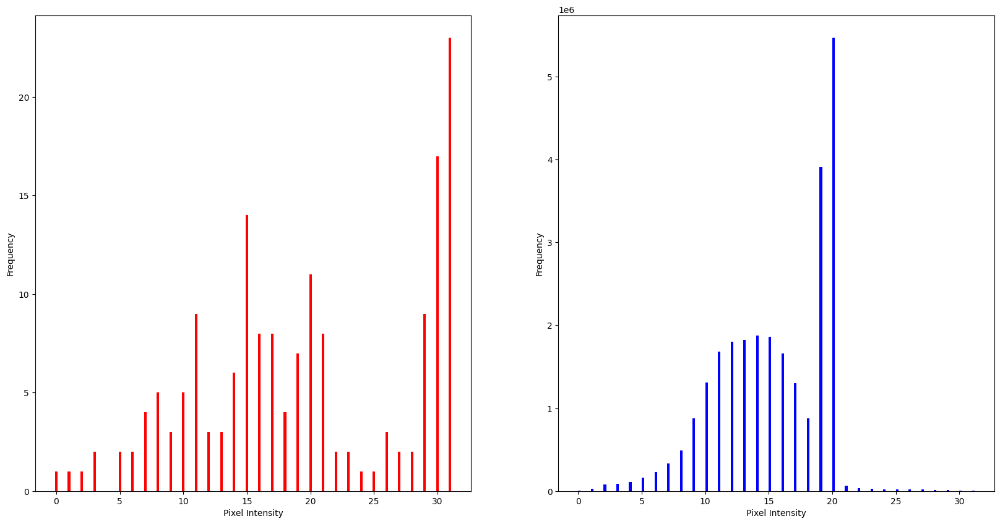

In [8]:
# Convert the grayscale image to a float representation
oryx_gray_float = img_as_float(oryx_gray)

# Resize the grayscale image to reduce its size by a factor of 20
oryx_gray_reduced = resize(oryx_gray_float, (oryx_gray_float.shape[0] / 20, oryx_gray_float.shape[1] / 20))

# Resize the grayscale image to augment its size by a factor of 20
oryx_gray_augmented = resize(oryx_gray_float, (oryx_gray_float.shape[0] * 20, oryx_gray_float.shape[1] * 20))

# Calculate the histogram for the reduced image with 32 bins
hist_reduced, _ = histogram(oryx_gray_reduced, nbins=32)

# Calculate the histogram for the augmented image with 32 bins
hist_augmented, _ = histogram(oryx_gray_augmented, nbins=32)

# Set the width of the bars in the histogram
bar_width = 0.20

# Create an array of indices for the histogram bars
ind = np.arange(32)

# Create subplots to display the histograms of the reduced and augmented images
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Plot the histogram for the reduced image
axs[0].bar(ind, hist_reduced, width=bar_width, color='red', label='Reduced')

# Plot the histogram for the augmented image, slightly shifted to the right
axs[1].bar(ind + 0.1, hist_augmented, width=bar_width, color='blue', label='Augmented')

# Set labels for the x-axis and y-axis for the reduced histogram
axs[0].set_xlabel('Pixel Intensity')
axs[0].set_ylabel('Frequency')

# Set labels for the x-axis and y-axis for the augmented histogram
axs[1].set_xlabel('Pixel Intensity')
axs[1].set_ylabel('Frequency')

# Display the histograms
plt.show()

- When an image is reduced by 20 times, a lot of information is lost, as the original pixels are removed. This causes a smoothing of details and less variability in pixel intensity values. In the histogram of the reduced image we can see that there is a clear irregularity in the frequency of pixel intensity. 
- On the other hand, when enlarging the image 20 times, new pixels must be created by interpolation to fill the additional space. This does not add new information, but extends the existing values, which makes the histogram smoother and more distributed, but does not change the distribution of the original intensity values. Therefore the histogram of the enlarged image is more similar.

b) Apply a convolution (7x7 uniform mask) on the resized images, calculate the histograms and compare the results.

1. Convolve the original `oryx_gray`image and calculate its histogram.
2. Convolve the reduced `oryx_gray` image 20 times and calculate its histogram.
3. Convolve the augmented `oryx_gray` image 20 times and calculate its histogram.

Comment what happens and why.

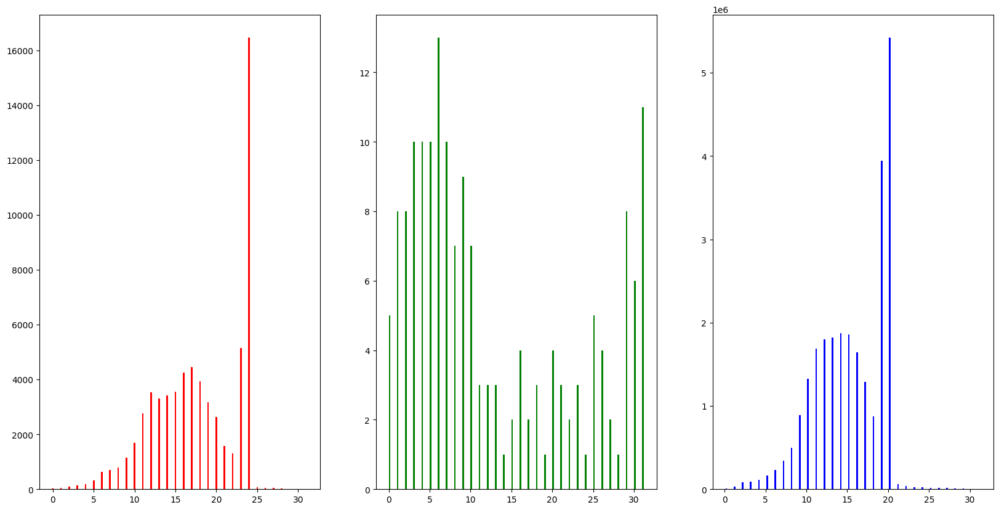

In [9]:
# Create a 7x7 uniform mask for convolution, where each element is 1/(7*7)
mask_7x7 = np.ones((7, 7)) / (7 * 7)

# Apply convolution using the mask to the original gray image
oryx_convolved = ndimage.convolve(oryx_gray_float, mask_7x7, mode='reflect')

# Apply convolution to the reduced resolution gray image
oryx_convolved_reduced = ndimage.convolve(oryx_gray_reduced, mask_7x7, mode='reflect')

# Apply convolution to the augmented gray image
oryx_convolved_augmented = ndimage.convolve(oryx_gray_augmented, mask_7x7, mode='reflect')

# Calculate histograms for each convolved image with 32 bins
hist_convoled_oryx, _ = histogram(oryx_convolved, nbins=32)
hist_convoled_oryx_reduced, _ = histogram(oryx_convolved_reduced, nbins=32)
hist_convoled_oryx_augmented, _ = histogram(oryx_convolved_augmented, nbins=32)

# Create an array of indices for the histogram bars
ind = np.arange(32)
bar_width = 0.2  # Set the width of each bar in the histogram

# Create subplots to display the histograms of the three convolved images
fig, axs = plt.subplots(1, 3, figsize=(20, 10))

# Plot the histogram for the original convolved image
axs[0].bar(ind, hist_convoled_oryx, width=bar_width, color='red', label='Original')

# Plot the histogram for the reduced convolved image, slightly shifted to the right
axs[1].bar(ind + 0.1, hist_convoled_oryx_reduced, width=bar_width, color='green', label='Reduced')

# Plot the histogram for the augmented convolved image, slightly shifted to the right
axs[2].bar(ind + 0.2, hist_convoled_oryx_augmented, width=bar_width, color='blue', label='Augmented')

plt.show()

 
- Convolution with a uniform mask smoothes the image by averaging pixel values over a 7x7 area, which reduces contrast and blurs edges and details. The histogram shows a more concentrated distribution, with less pronounced peaks at the extremes, as smoothing reduces the amount of sharp variations in intensity.
- By convolving the reduced image (20 times smaller), the smoothing is more evident. Since the image already lost a lot of detail during reduction, convolution tends to make the intensity of the pixels even more uniform. This results in a histogram with a more concentrated distribution over a narrow range of intensities, as there is less variability in the pixel values. 
- In the enlarged image (20 times larger), convolution also smooths the image. This results in a smoother histogram, with a similar shape to the histogram of the original image, but with some differences in fine details due to interpolation and the larger image size.


### 2.4 Image processing with weighting and non-linear filters

a) Generate the following kernels and apply them to the `oryx_gray` image:

1. Gaussian kernel with sigma = 1
2. Gaussian kernel with 3 different sigma values. Which is the most adequate value for keeping the main objects and structures of the image?
3. Median filter with different mask shapes: disk, rectangle, and diamond. What is the effect of using different kinds of filters on the original image?

Comment the effect of using different kinds of filters on the original image.

**Hint:** Search for the [skimage.filters function](https://scikit-image.org/docs/stable/api/skimage.filters.html) for creating the different filters.

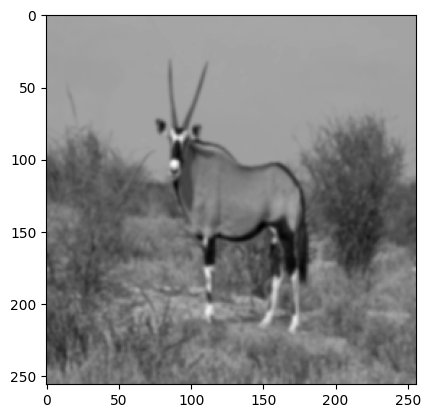

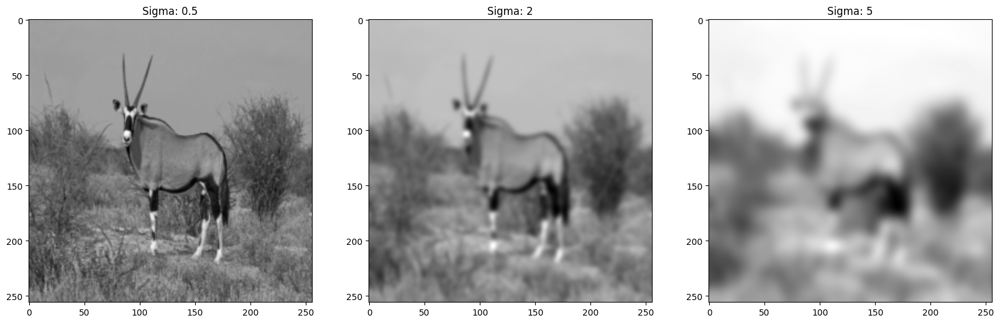

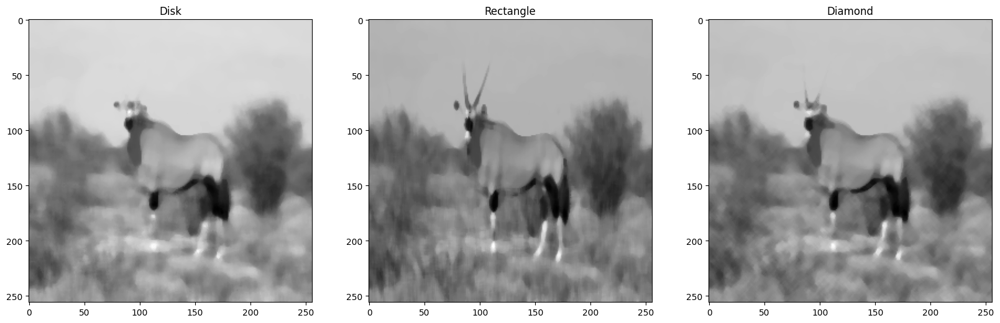

In [10]:
def processing_nonlineal(img):
    # Apply Gaussian filter to the input image with a default sigma value of 1
    gaussian_kernel = skimage.filters.gaussian(img, sigma=1)
    
    # Display the image after applying the Gaussian filter with sigma = 1
    plt.imshow(gaussian_kernel, cmap='gray')
    
    # Define a list of different sigma values to apply the Gaussian filter
    sigma_values = [0.5, 2, 5]
    
    # Create subplots for visualizing the effects of different sigma values
    fig, axs = plt.subplots(1, len(sigma_values), figsize=(20, 10))
    
    # Loop through the defined sigma values and apply the Gaussian filter
    for i, s_value in enumerate(sigma_values):
        # Apply Gaussian filter with the current sigma value
        gaussian_kernel = skimage.filters.gaussian(img, sigma=s_value)
        
        # Display the filtered image in the subplot
        axs[i].imshow(gaussian_kernel, cmap='gray')
        
        # Set the title of the subplot to show the current sigma value
        axs[i].set_title(f'Sigma: {s_value}')

    # Create masks for median filtering using different shapes
    mask_disk = disk(5)  # Disk-shaped mask with radius 5
    mask_rectangle = rectangle(10, 5)  # Rectangle-shaped mask with dimensions 10x5
    mask_diamond = diamond(5)  # Diamond-shaped mask with radius 5

    # Apply median filter to the image using the disk-shaped mask
    median_disk = ndimage.median_filter(img, footprint=mask_disk)
    
    # Apply median filter using the rectangle-shaped mask
    median_rectangle = ndimage.median_filter(img, footprint=mask_rectangle)
    
    # Apply median filter using the diamond-shaped mask
    median_diamond = ndimage.median_filter(img, footprint=mask_diamond)

    # Create subplots for visualizing the results of median filtering
    fig, axs = plt.subplots(1, 3, figsize=(20, 10))
    
    # Display the median-filtered image with the disk-shaped mask
    axs[0].imshow(median_disk, cmap='gray')
    axs[0].set_title('Disk')
    
    # Display the median-filtered image with the rectangle-shaped mask
    axs[1].imshow(median_rectangle, cmap='gray')
    axs[1].set_title('Rectangle')
    
    # Display the median-filtered image with the diamond-shaped mask
    axs[2].imshow(median_diamond, cmap='gray')
    axs[2].set_title('Diamond')
    
    # Show all the plots
    plt.show()

# Call the function to process the image `oryx_gray` with non-linear filtering techniques
processing_nonlineal(oryx_gray)


- In the image with the Gaussian filter with sigma = 1 we can see that the image is slightly softened, this produces a reduction of the high frequency noise without affecting too much the details of the image. 
Then by applying 3 sigmas of different values we can observe that by increasing the sigma value, the Gaussian filter applies a stronger blur, which softens the image more and makes the details become blurred. 
- That is, with a low sigma, the softening is subtle, allowing the main structures and edges of the image to remain well defined. A high sigma, on the other hand, can make the image too soft, removing important details.
- When applying median filters with disk, rectangle and diamond shapes we can determine that the disk-shaped median filter adapts well to the natural, rounded structures in the image, removing noise effectively without distorting the original shapes too much. In contrast, the rectangle median filter introduces artifacts in the straight-edged areas of the image, as the size of the mask affects the way the edges are smoothed. Finally, the diamond mask softens noise and preserves corner and corner details better.

b) **(Optional)** Apply the smoothing on some other images and present their results.

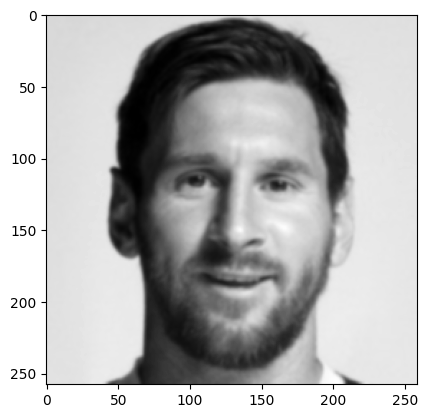

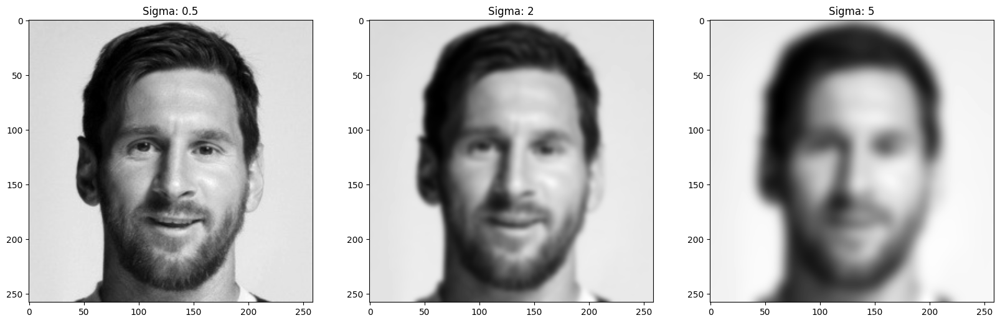

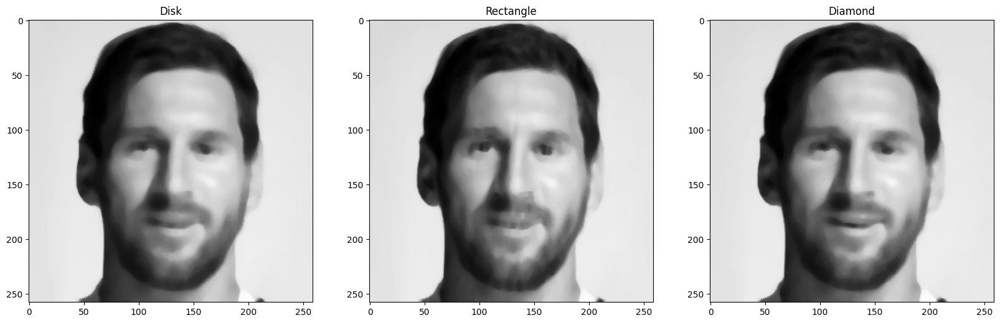

In [11]:
img_m = rgb2gray(io.imread('./images_notebook/messi.jpg'))
processing_nonlineal(img_m)

### 2.5 Determine the optimal contour 

a) Load the 'logo_pozo.jpg' image and visualize its contours.	

<img src="images_notebook/logo_pozo.jpg" width="400" height="400">


Apply the different contour extraction tecniques introduced during the theory session and change any parameter if necessary for detecting the edges of the image:

1. Prewitt
2. Sobel
3. Canny

Use subplot and title to visualize the results.

#### **Questions**

- Which is the best countour detection technique? 

- Which are the optimal parameters for this image? 

- Is it necessary to normalize the mask as we do in the filtering applied for the smoothing? 

**Hint**: use `skimage.feature.canny` for applying the canny filter and `skimage.filters` for the rest.

**(Optional)** Superimpose the contours over the image.

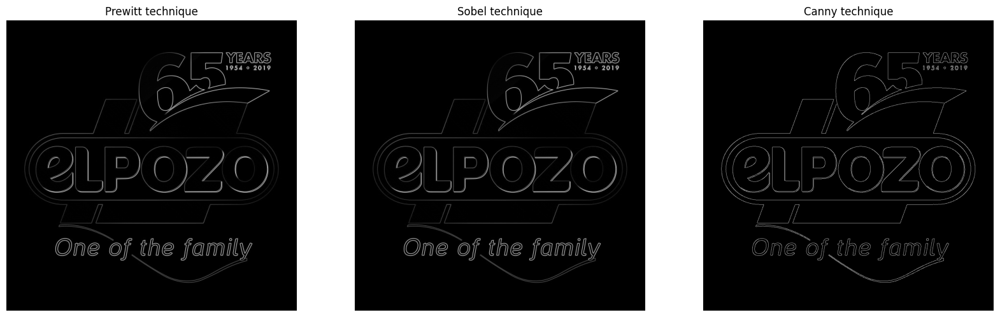

In [12]:
def convolse_techiques(img):
    # Convert the input image to grayscale using rgb2gray
    path_gray = rgb2gray(img)

    # Apply Prewitt edge detection on the grayscale image
    logo_prewitt = skimage.filters.prewitt(path_gray)
    
    # Apply Sobel edge detection on the grayscale image
    logo_sobel = skimage.filters.sobel(path_gray)
    
    # Apply Canny edge detection on the grayscale image with a specified sigma for Gaussian smoothing
    logo_canny = skimage.feature.canny(path_gray, sigma=1)

    # Store the results of the edge detection techniques in a dictionary for easy access
    tecnhiques = {
        'Prewitt': logo_prewitt, 
        'Sobel': logo_sobel, 
        'Canny': logo_canny
    }
    
    # Create a figure with subplots for visualizing the results
    fig, axs = plt.subplots(1, len(tecnhiques), figsize=(20, 10))

    # Loop through the techniques dictionary to display each edge-detected image
    for i, (title, img) in enumerate(tecnhiques.items()):
        axs[i].imshow(img, cmap='gray')  # Show the image in grayscale
        axs[i].set_title(f"{title} technique")  # Set the title for each subplot
        axs[i].axis('off')  # Hide the axes for a cleaner appearance
    
    # Display the plots
    plt.show()

# Load the logo image from the specified path
logo_pozo = io.imread('images_notebook/logo_pozo.jpg')
# Call the function to apply and visualize the edge detection techniques on the logo image
convolse_techiques(logo_pozo)



#### Which is the best countour detection technique? 
- The best contour detection technique is Canny, since it applies smoothing with a Gaussian filter and then detects the gradients, which allows to capture finer details and eliminate noise. In the image you can see clear advantages over the other two techniques, especially where there are double edges.
 
#### Which are the optimal parameters for this image? 
- For Canny the sigma must be adjusted. A low value can detect more edge but also more noise, while a high value captures only the most prominent contours. So the optimal parameter for this image would be the lowest possible sigma (sigma = 0), since we have no noise we want to eliminate.
- In the case of Sobel and Prewitt, on the other hand, there are not so many adjustable parameters, but a smoothing can be applied beforehand to reduce the noise before edge detection.

#### Is it necessary to normalize the mask as we do in the filtering applied for the smoothing? 
- It is not necessary to normalize the mask in edge detection, since contour detection filters operate by detecting changes in pixel intensity, i.e. gradient, and mask normalization is not a step that is required for this activity. Normalization is more relevant in smoothing filters, where the aim is to average pixel values to reduce noise.


b)	Repeat the experiment with other images, you can use the ones included in the folder **images**. Comment if some parameter needs to be changed for the different images.

#### **Questions**

- Are the contours improved if the image is previously smoothed? 
- Which are the limitations of the different images contour extraction?

Oryx image withouth smoothing


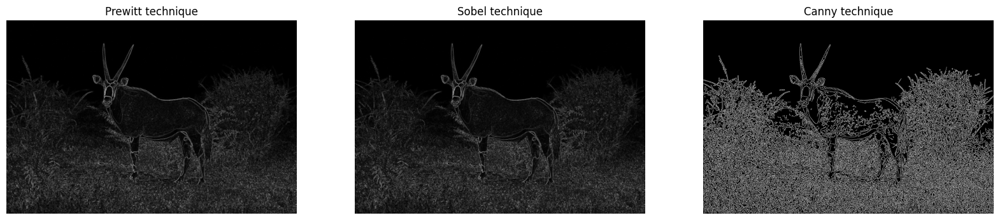

Oryx image with smoothing


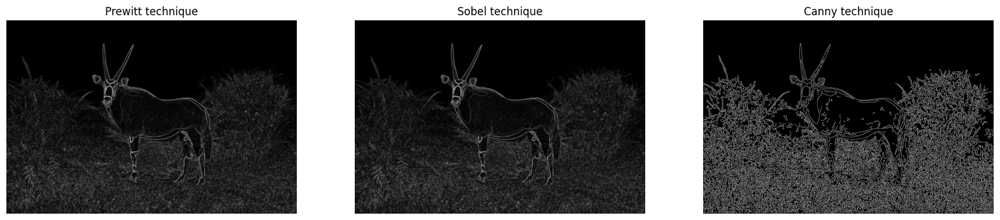

Car image withouth smoothing


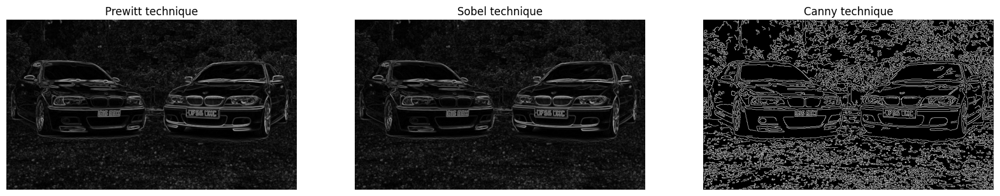

Car image with smoothing


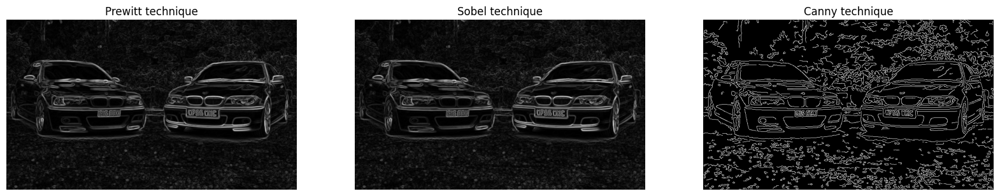

CR image withouth smoothing


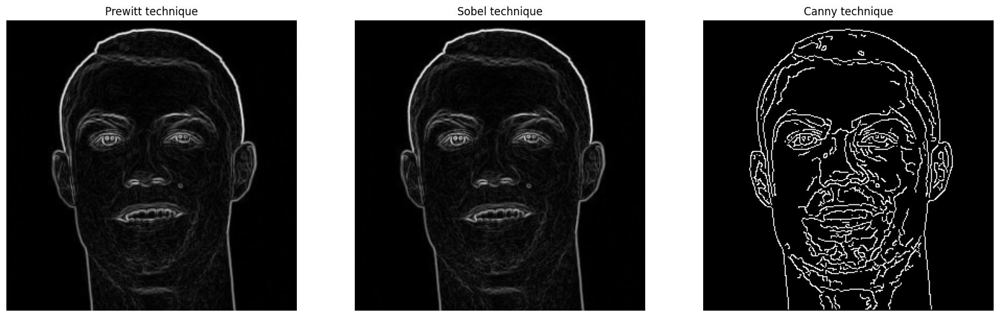

CR image with smoothing


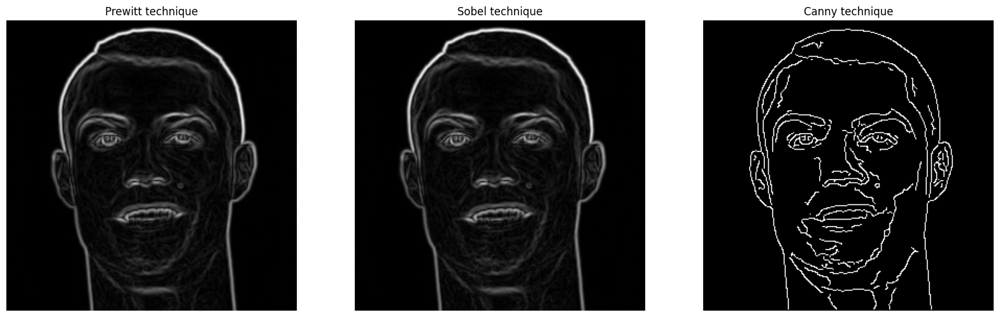

In [13]:
print("Oryx image withouth smoothing")
img_oryx = io.imread('images_notebook/oryx.jpg')
convolse_techiques(img_oryx)

print("Oryx image with smoothing")
img_oryx_smooth = skimage.filters.gaussian(img_oryx, sigma=1)
convolse_techiques(img_oryx_smooth)


print("Car image withouth smoothing")
img_car = io.imread('images_notebook/car.png')
convolse_techiques(img_car)

print("Car image with smoothing")
img_car_smooth = skimage.filters.gaussian(img_car, sigma=1)
convolse_techiques(img_car_smooth)


print("CR image withouth smoothing")
img_CR = io.imread('images_notebook/CR.jpg')
convolse_techiques(img_CR)

print("CR image with smoothing")
img_CR_smooth = skimage.filters.gaussian(img_CR, sigma=1)
convolse_techiques(img_CR_smooth)



-  Depending on the image it is necessary to adjust the threshold in the canny filter to optimize contour detection. Pre-smoothing may also need to be adjusted in images with a lot of noise. 
#### Are the contours improved if the image is previously smoothed?
- Yes, smoothing the image before applying contour detection can improve the results, especially in noisy images. Mostly it is beneficial for contour detection with the canny filter, but you can also see an improvement in the results for Prewitt and sobel by reducing false contour detection.
#### Which are the limitations of the different images contour extraction?
- The limitations are mainly noise, which can generate false contours. Also if the objects in the image do not have clear edges or the contrast between the objects and the background is low, contour detection filters may fail to capture all details.  Also the variability in the scale of the objects, i.e. simple filters like Prewitt and Sobel are not suitable for images where the objects have different scales.


c) Apply the Sobel and Prewwit filters using the `convolve` function instead of the `skimage.filters` package. Compare the results.

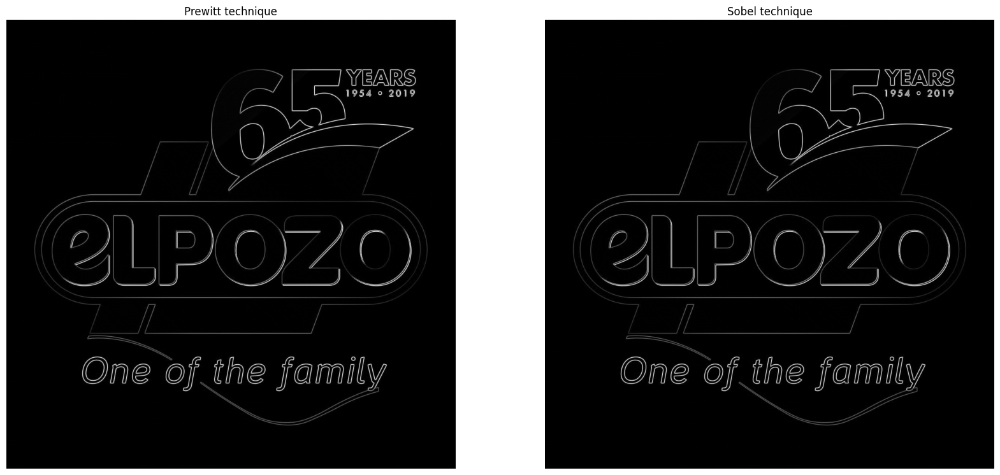

In [14]:
def convolved_SP_techniques(img):
    # Convert the input image to grayscale
    img_gray = rgb2gray(img)

    # Define the Sobel horizontal mask for edge detection
    maskh_sobel = [
        [-1, -2, -1],
        [0, 0, 0],
        [1, 2, 1]
    ]
    # Define the Sobel vertical mask for edge detection
    maskv_sobel = [
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]
    ]

    # Define the Prewitt horizontal mask for edge detection
    maskh_prewitt = [
        [-1, -1, -1],
        [0, 0, 0],
        [1, 1, 1]
    ]
    # Define the Prewitt vertical mask for edge detection
    maskv_prewitt = [
        [-1, 0, 1],
        [-1, 0, 1],
        [-1, 0, 1]
    ]

    # Apply Prewitt horizontal mask to the grayscale image
    prewitt_h = ndimage.convolve(img_gray, maskh_prewitt)
    # Apply Prewitt vertical mask to the grayscale image
    prewitt_v = ndimage.convolve(img_gray, maskv_prewitt)

    # Apply Sobel horizontal mask to the grayscale image
    sobel_h = ndimage.convolve(img_gray, maskh_sobel)
    # Apply Sobel vertical mask to the grayscale image
    sobel_v = ndimage.convolve(img_gray, maskv_sobel)

    # Combine the horizontal and vertical Prewitt responses to get the edge magnitude
    prewitt_img = np.hypot(prewitt_h, prewitt_v)
    # Combine the horizontal and vertical Sobel responses to get the edge magnitude
    sobel_img = np.hypot(sobel_h, sobel_v)

    # Create a dictionary to store the results of the two techniques
    tecnhiques = {
        'Prewitt': prewitt_img,
        'Sobel': sobel_img
    }
    
    # Create a figure with 2 subplots to display the results
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))

    # Loop through the techniques dictionary to display images
    for i, (title, img) in enumerate(tecnhiques.items()):
        axs[i].imshow(img, cmap='gray')  
        axs[i].set_title(f"{title} technique")  
        axs[i].axis('off')  
    
    plt.show()

convolved_SP_techniques(logo_pozo)


- We can observe that the contours obtained by convolve are slightly less fine and present some slight noises. This is because it does not present the internal optimization of the filters applied with skimage.filters. In conclusion the results are similar but the fine details are better obtained with the filters applied with skimage.filters.

### 2.6 Applying smoothing in order to obtain hybrid images

a) Given `./images_notebook/messi.jpg` and `./images_notebook/cr.jpg` images:

1. Plot both images.
2. Apply a low-pass filter to both of them and plot them.
3. Apply a high-pass filter to both of them and plot them.

The result should be something like:

![messi](images_notebook/Messi.png) 

![cr](images_notebook/CR.png)


By applying smoothing over an image I, we apply a `low-pass` filter. The resulting image can be called L(I). If we substract the filtered one from the original image, we obtain its high frequencies, that we can call H(I), i.e. we apply a `high-pass` filter. 

***H(I) = I - L(I)***

Hint: In order to highlight the effect, in the L(I) image you should define a lower sigma, while for the H(I) you should use a higher one. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5536629112222988..0.5554686476394424].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5453133632826651..0.5878260122119301].


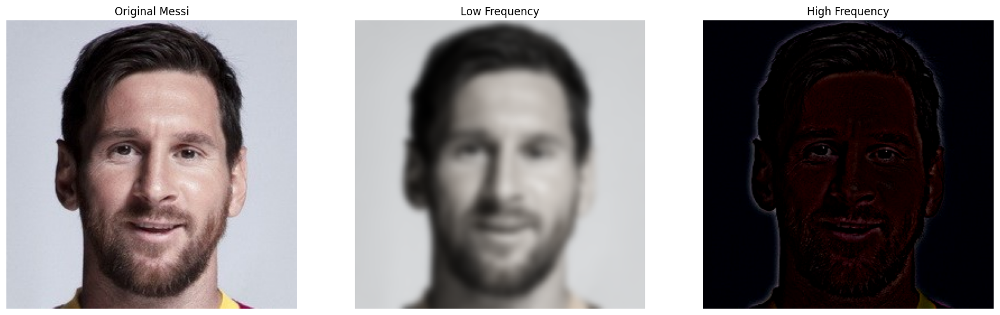

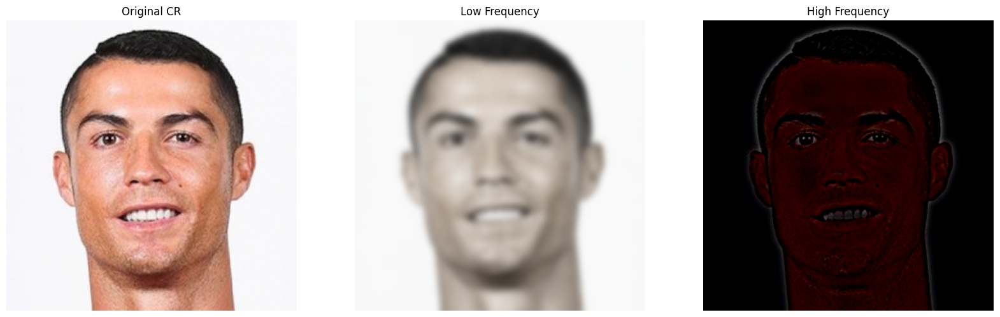

In [15]:
# Load the images and normalize pixel values to the range [0, 1]
img_messi = io.imread('./images_notebook/messi.jpg') / 255
img_cr = io.imread('./images_notebook/cr.jpg') / 255

# Convert the loaded images to grayscale
img_messi_gray = color.rgb2gray(img_messi)
img_cr_gray = color.rgb2gray(img_cr)

# High-pass filter configuration
sigma_high = 3  # Higher sigma for Gaussian filter to achieve a high-pass effect

# Apply Gaussian filter to create low-frequency components for both images
L_messi = filters.gaussian(img_messi, sigma=sigma_high)
L_cr = filters.gaussian(img_cr, sigma=sigma_high)

# Compute the high-frequency components by subtracting the low-frequency components from the original images
H_messi = img_messi - L_messi
H_cr = img_cr - L_cr

# Visualize results for Messi
fig, axs = plt.subplots(1, 3, figsize=(20, 10))
axs[0].imshow(img_messi)
axs[0].set_title('Original Messi')
axs[0].axis('off')

axs[1].imshow(L_messi, cmap='gray')
axs[1].set_title('Low Frequency')
axs[1].axis('off')

axs[2].imshow(H_messi, cmap='gray')
axs[2].set_title('High Frequency')
axs[2].axis('off')

# Visualize results for CR
fig, axs = plt.subplots(1, 3, figsize=(20, 10))
axs[0].imshow(img_cr)
axs[0].set_title('Original CR')
axs[0].axis('off')

axs[1].imshow(L_cr, cmap='gray')
axs[1].set_title('Low Frequency')
axs[1].axis('off')

axs[2].imshow(H_cr, cmap='gray')
axs[2].set_title('High Frequency')
axs[2].axis('off')

plt.show()


b) Create hybrid images and visualize them. A hybrid image is obtained by combining the low and high frequencies of the image, i.e. combining the results obtained by the `low-pass` and `high-pass` filters.

<img src="images_notebook/Fusion.gif" width="400" height="400">

Hybrid (I1, I2) = L(I1) + H(I2)

1. Analyze which is the best way of showing it if our aim is to see Messi's face. 
2. Additionally, rescale the image to a different size and comment the results. 

Present the different visualizations of the experiment performed.

<img src="images_notebook/Hybrid.png">


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.015032410761636694..1.3346008024793483].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.34924126387151616..1.1505097376844748].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.015032410761636694..1.3346008024793483].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.34924126387151616..1.1505097376844748].


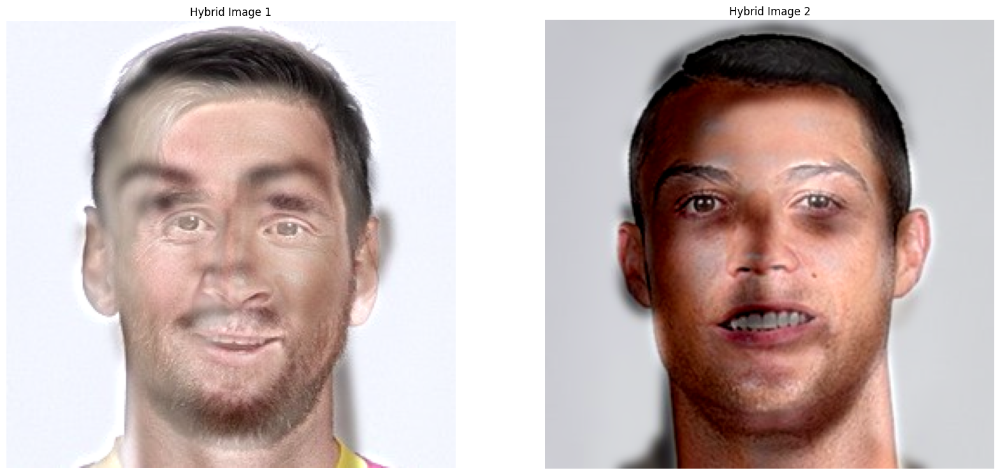

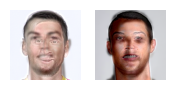

In [16]:
# Resize the L_messi image to match the dimensions of H_cr
L_messi_rescale = resize(L_messi, (H_cr.shape[0], H_cr.shape[1]))

# Resize the L_cr image to match the dimensions of H_messi
L_cr_rescale = resize(L_cr, (H_messi.shape[0], H_messi.shape[1]))

# Create the first hybrid image by combining the resized L_cr and the high-frequency component of H_messi
Hybrid_image_1 = L_cr_rescale + H_messi

# Create the second hybrid image by combining the resized L_messi and the high-frequency component of H_cr
Hybrid_image_2 = L_messi_rescale + H_cr

# Create a figure with two subplots to display the hybrid images side by side
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Display the first hybrid image in the first subplot and set its title
axs[0].imshow(Hybrid_image_1)
axs[0].set_title('Hybrid Image 1')
axs[0].axis('off')  

# Display the second hybrid image in the second subplot and set its title
axs[1].imshow(Hybrid_image_2)
axs[1].set_title('Hybrid Image 2')
axs[1].axis('off')  

# Create another figure with smaller subplots to show smaller versions of the hybrid images
fig, axs = plt.subplots(1, 2, figsize=(2, 2))

# Display the first hybrid image in the first small subplot
axs[0].imshow(Hybrid_image_1)
axs[0].axis('off')  

# Display the second hybrid image in the second small subplot
axs[1].imshow(Hybrid_image_2)
axs[1].axis('off')  


plt.show()

#### Analyze which is the best way of showing it if our aim is to see Messi's face. 
- The best way to show messi is to use the high frequencies of messi's image and the low frequencies of cristiano ronaldo.

#### Additionally, rescale the image to a different size and comment the results. 
- We can see that by reducing the image to a smaller size we visualize the face of the other person, i.e. in the first image at normal scale we can see the face of messi, but by reducing the normal size we can see the face of cristiano ronaldo. And vice versa with the other image.

### 2.7 Anonimization of sensitive information

One of the important problems in Computer Vision as a science that manages data (images and videos) is the anonimization of sensitive information appearing in the images.
For example, it is common in applications like Google Street View, where the faces and license plates are anonymized.
The file `./images_notebook/car.png` contains two cars. Anonimize the license plates of the cars using the techniques learned in this practicum.

Modify only the license plates of the cars, keeping the rest of the image unchanged.

![car](images_notebook/car.png)

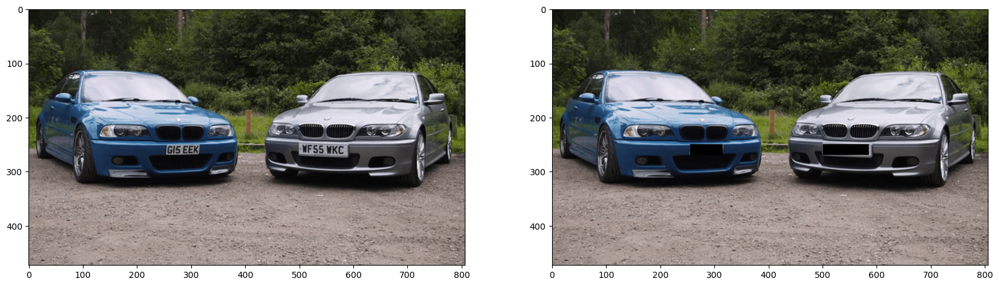

In [17]:
# Load the image of the car
image_car = io.imread("./images_notebook/car.png")

# Coordinates for the regions where the license plates are located (x1, x2, y1, y2)
coords_plates = {
    (250, 270, 255, 315),  # First plate region
    (250, 270, 500, 585)   # Second plate region
}

# Create a copy of the original image to avoid modifying the original one
image_without_plate = image_car.copy()

# Loop through each set of coordinates in coords_plates
for i, ((x1, x2, y1, y2)) in enumerate(coords_plates):
    # Apply Gaussian blur to the region corresponding to the license plate
    # with a sigma of 2 to anonymize it
    image_without_plate[x1:x2, y1:y2] = skimage.filters.gaussian(image_without_plate[x1:x2, y1:y2], sigma=4)

# Create a figure with two subplots for displaying the images side by side
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].imshow(image_car) 
axs[1].imshow(image_without_plate)